<a href="https://colab.research.google.com/github/Pavel184/Neural_networks/blob/Homework_lesson_6/Homework_lesson_6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Homework_lesson_6

## Практическое задание

1. Попробуйте обучить нейронную сеть U-Net на любом другом датасете. 
2. Опишите  результата. Что помогло повысить точность?
 
3. *Попробуйте свои силы в задаче Carvana на Kaggle - https://www.kaggle.com/c/carvana-image-masking-challenge/overview4. 
4. *Сделайте свою реализацию U-Net на TensorFlow

In [1]:
!pip install git+https://github.com/tensorflow/examples.git

  Cloning https://github.com/tensorflow/examples.git to /tmp/pip-req-build-qxp0zdzh
  Running command git clone -q https://github.com/tensorflow/examples.git /tmp/pip-req-build-qxp0zdzh
  Created wheel for tensorflow-examples: filename=tensorflow_examples-079eae91b01d7666471c9e01dadd031e2c2a00f2_-py3-none-any.whl size=271371 sha256=a4c1ef10d61ee1fa7363711e4608e06ce1d8fc27d7fba116cd81c8833305917a
  Stored in directory: /tmp/pip-ephem-wheel-cache-9ly7egnn/wheels/eb/19/50/2a4363c831fa12b400af86325a6f26ade5d2cdc5b406d552ca
Failed to build tensorflow-examples
    Running setup.py install for tensorflow-examples ... done
  DEPRECATION: tensorflow-examples was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. You can find discussion regarding this at https://github.com/pypa/pip/issues/8368.


In [2]:
try:
  %tensorflow_version only exists in Colab.
  #%tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf

Unknown TensorFlow version: only exists in Colab.
Currently selected TF version: 2.x
Available versions:
 * 1.x
 * 2.x


In [3]:
from __future__ import absolute_import, division, print_function, unicode_literals

from tensorflow_examples.models.pix2pix import pix2pix

import tensorflow_datasets as tfds
tfds.disable_progress_bar()

from IPython.display import clear_output
import matplotlib.pyplot as plt

from tensorflow.keras.layers import Conv2DTranspose, MaxPooling2D, Conv2D, BatchNormalization

import tensorflow as tf
tf.config.experimental.set_visible_devices([], 'GPU')

Загрузка датасета CaltechBirds2010

In [4]:
ds_names = ( 'CaltechBirds2010:0.1.1',)
dataset_all, info = tfds.load(ds_names[0], split = ['train[:10%]','test[-10%:]'], with_info=True)

Shuffling and writing examples to /root/tensorflow_datasets/caltech_birds2010/0.1.1.incomplete5A16J1/caltech_birds2010-train.tfrecord
Shuffling and writing examples to /root/tensorflow_datasets/caltech_birds2010/0.1.1.incomplete5A16J1/caltech_birds2010-test.tfrecord
Dataset caltech_birds2010 downloaded and prepared to /root/tensorflow_datasets/caltech_birds2010/0.1.1. Subsequent calls will reuse this data.


In [5]:
info

tfds.core.DatasetInfo(
    name='caltech_birds2010',
    version=0.1.1,
    description='Caltech-UCSD Birds 200 (CUB-200) is an image dataset with photos 
of 200 bird species (mostly North American). The total number of 
categories of birds is 200 and there are 6033 images in the 2010 
dataset and 11,788 images in the 2011 dataset.
Annotations include bounding boxes, segmentation labels.',
    homepage='http://www.vision.caltech.edu/visipedia/CUB-200.html',
    features=FeaturesDict({
        'bbox': BBoxFeature(shape=(4,), dtype=tf.float32),
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=200),
        'label_name': Text(shape=(), dtype=tf.string),
        'segmentation_mask': Image(shape=(None, None, 1), dtype=tf.uint8),
    }),
    total_num_examples=6033,
    splits={
        'test': 3033,
        'train': 3000,
    },
    supervised_keys=('ima

Функции нормализации, аугментации, изменения размера картинки

In [6]:
def normalize(input_image, input_mask):
  input_image = tf.cast(input_image, tf.float32) / 255.0
#  input_mask -= 1
  return input_image, input_mask

In [7]:
@tf.function
def load_image_train(datapoint):
  input_image = tf.image.resize(datapoint['image'], (128, 128))
  input_mask = tf.image.resize(datapoint['segmentation_mask'], (128, 128))

  if tf.random.uniform(()) > 0.5:
    input_image = tf.image.flip_left_right(input_image)
    input_mask = tf.image.flip_left_right(input_mask)

  input_image, input_mask = normalize(input_image, input_mask)

  return input_image, input_mask

In [8]:
@tf.function
def load_image_test(datapoint):
  input_image = tf.image.resize(datapoint['image'], (128, 128))
  input_mask = tf.image.resize(datapoint['segmentation_mask'], (128, 128))

  input_image, input_mask = normalize(input_image, input_mask)

  return input_image, input_mask

In [9]:
def resize(image,label):
  image = tf.image.resize(image,[128,128])
  return (image,label)

Преобразования train test

In [10]:
TRAIN_LENGTH = info.splits['train'].num_examples
BATCH_SIZE = 16
BUFFER_SIZE = 128
STEPS_PER_EPOCH = TRAIN_LENGTH // 10 // BATCH_SIZE

In [11]:
train = dataset_all[0].map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train = train.map(resize)
test = dataset_all[1].map(load_image_test)
test = test.map(resize)

In [12]:
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
test_dataset = test.batch(BATCH_SIZE)

Функция отображения

In [13]:
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

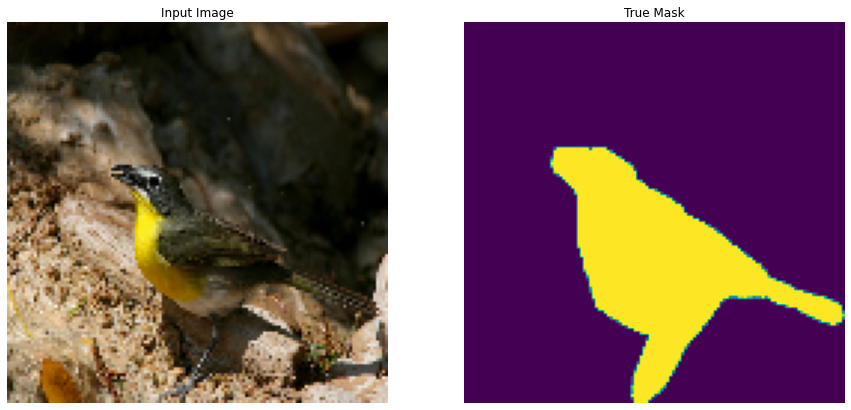

In [14]:
for image, mask in test_dataset.take(1):
  sample_image, sample_mask = image, mask
display([sample_image[0,:,:,:], sample_mask[0,:,:,:]])

Задание числа выходных каналов(классов)

In [15]:
OUTPUT_CHANNELS = 2

Загрузка предтренированной модели MobileNetV2

In [16]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
layers = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)

down_stack.trainable = False

9420800/9406464 [==============================] - 0s 0us/step


Апсемплер

In [17]:
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

Функция создания модели

In [18]:
def unet_model(output_channels):
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])
  x = inputs

  # Downsampling through the model
  skips = down_stack(x)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      output_channels, 3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

Создание модели

In [19]:
model_1 = unet_model(OUTPUT_CHANNELS)
model_1.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

Архитектура модели.

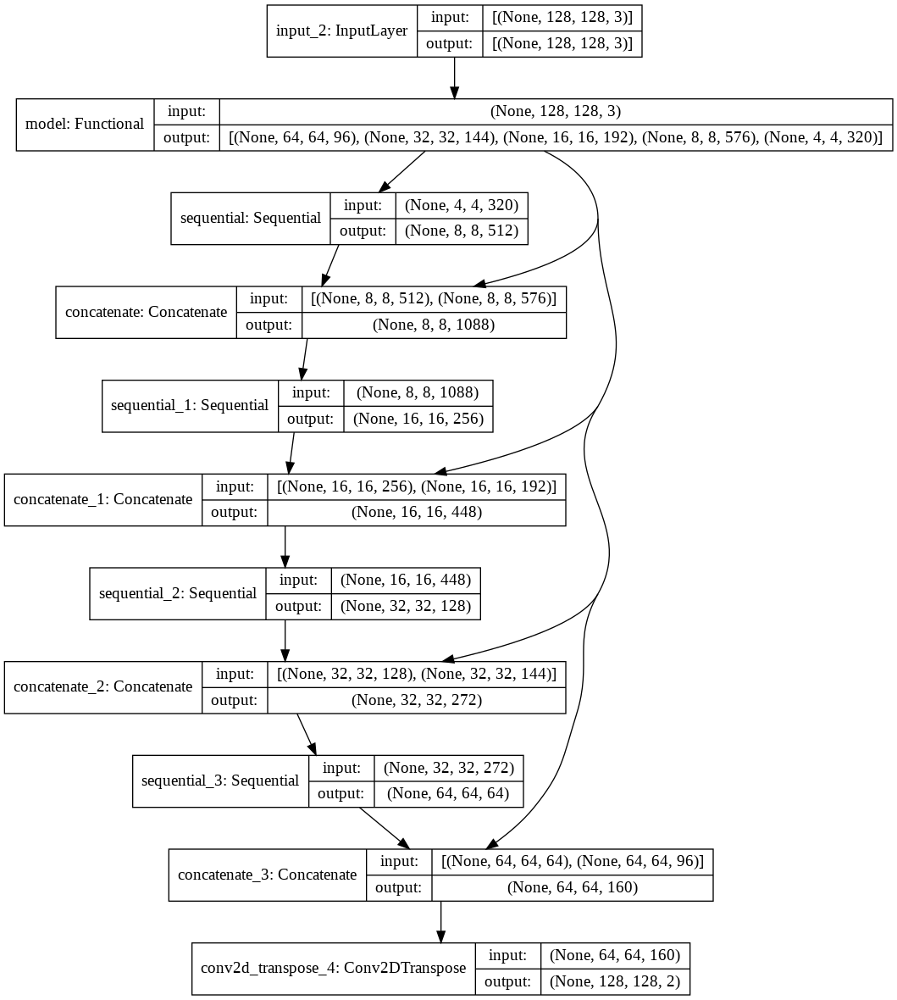

In [20]:
tf.keras.utils.plot_model(model_1, show_shapes=True)


Фукция маски(определение класса)

In [21]:
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

Функция отображение предикта

In [22]:
def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      print(1)
      pred_mask = model_1.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image[0,:,:,:], sample_mask[0,:,:,:],
             create_mask(model_1.predict(sample_image[:,:,:]))])



Функция callback

In [23]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    clear_output(wait=True)
    show_predictions()
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

Обучение модели

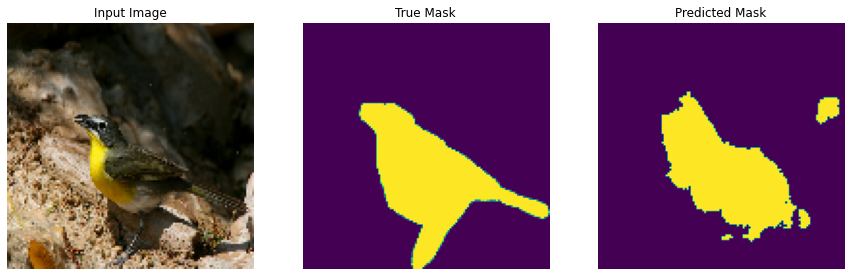


Sample Prediction after epoch 20



In [24]:
EPOCHS = 20
VAL_SUBSPLITS = 5
VALIDATION_STEPS = info.splits['test'].num_examples//10//BATCH_SIZE//VAL_SUBSPLITS

model_history_1 = model_1.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_dataset,
                          callbacks=[DisplayCallback()])

Предикты

1


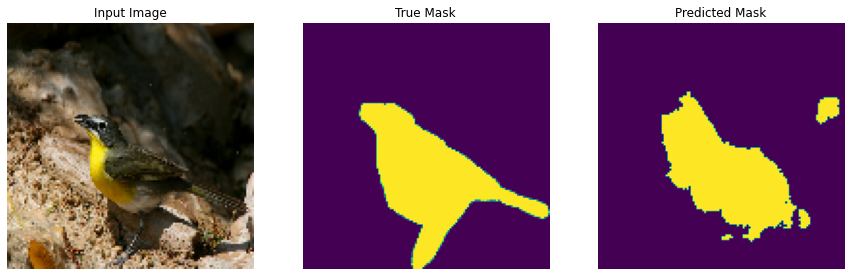

1


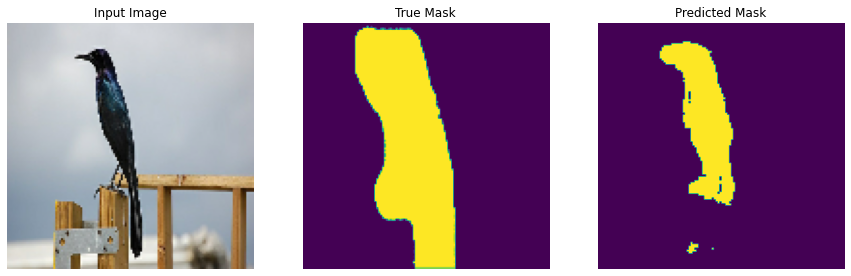

1


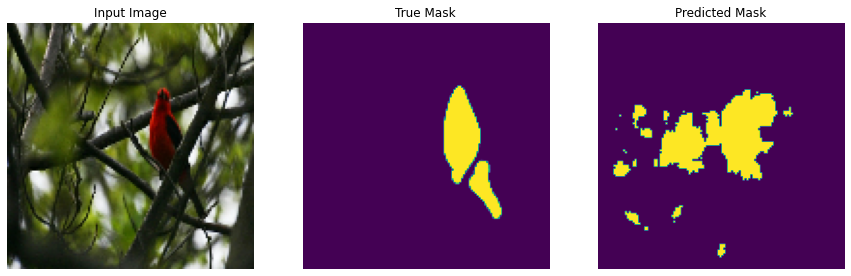

1


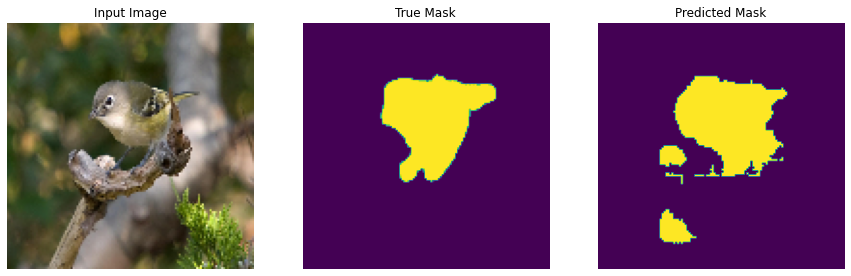

1


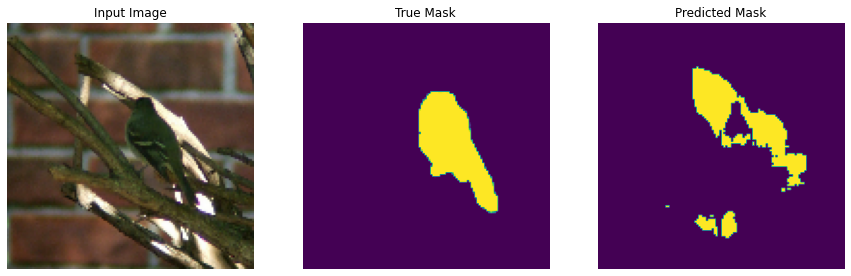

1


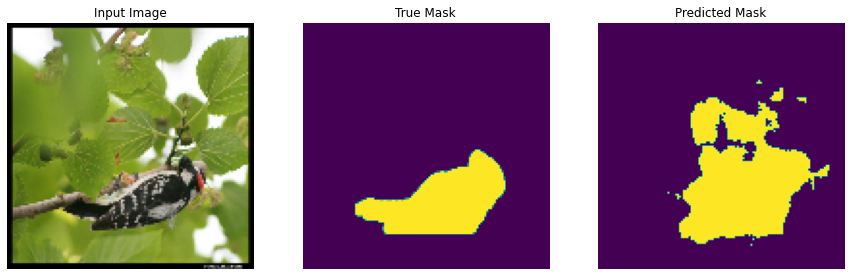

1


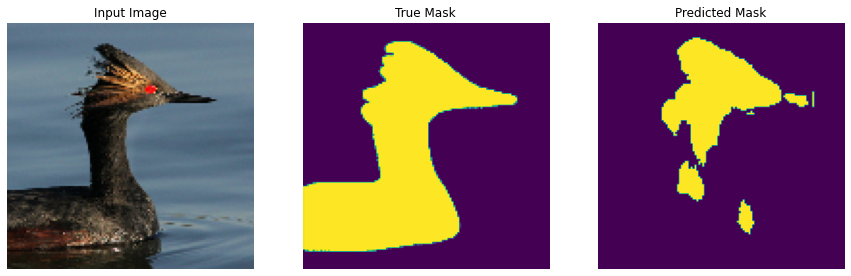

1


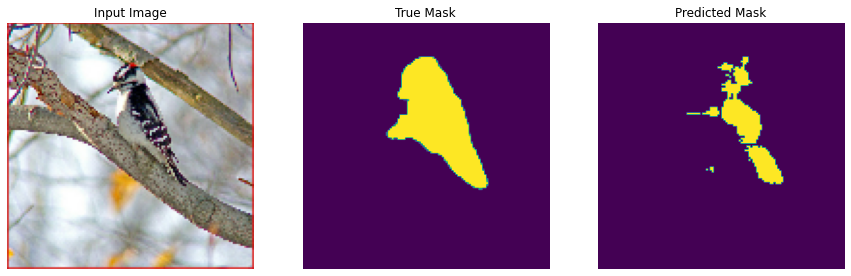

1


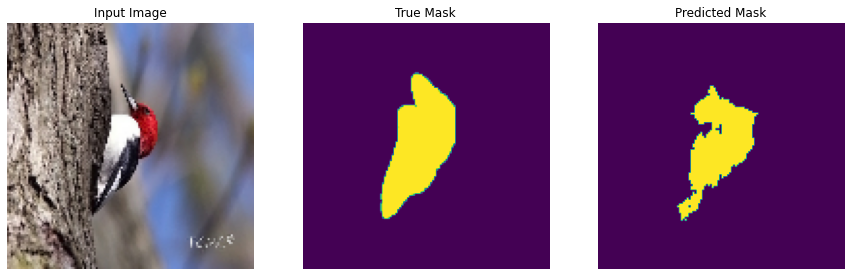

1


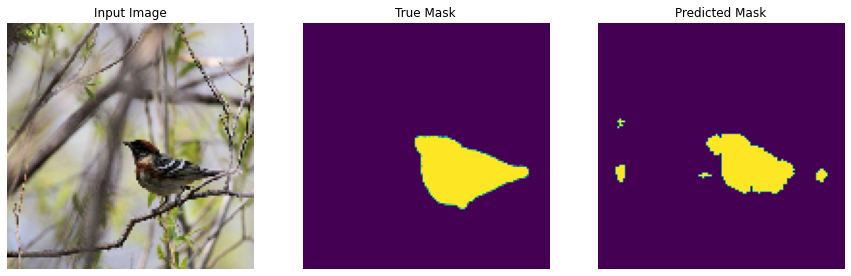

1


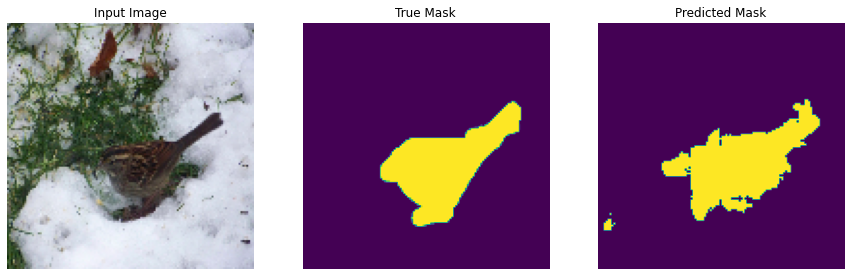

1


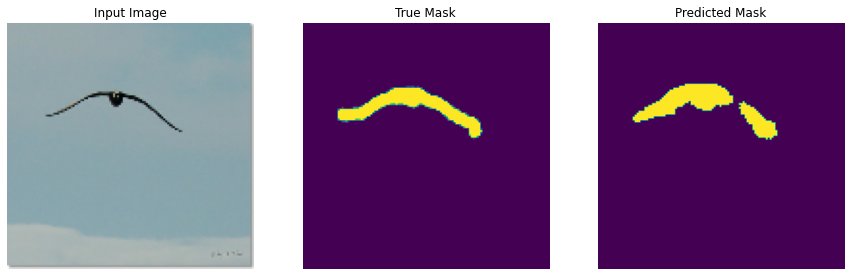

1


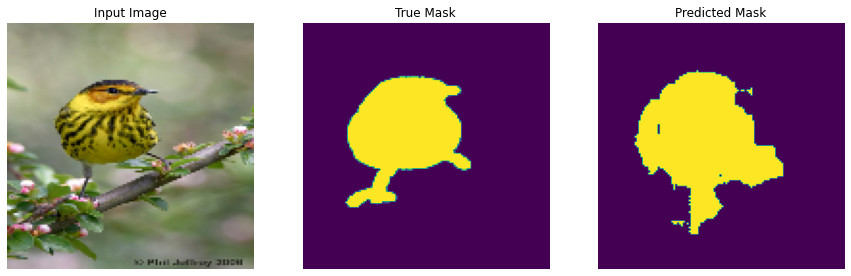

1


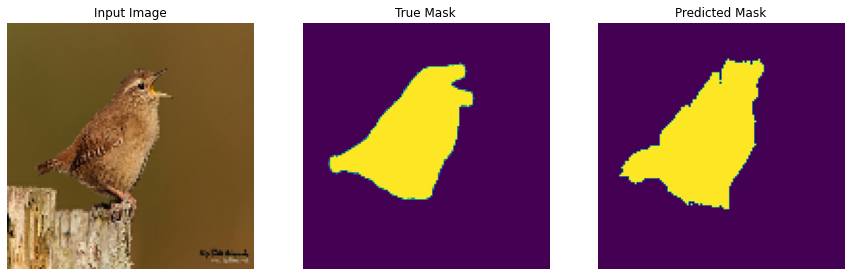

1


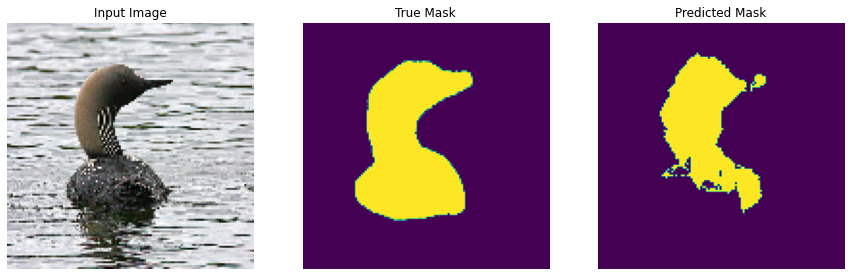

1


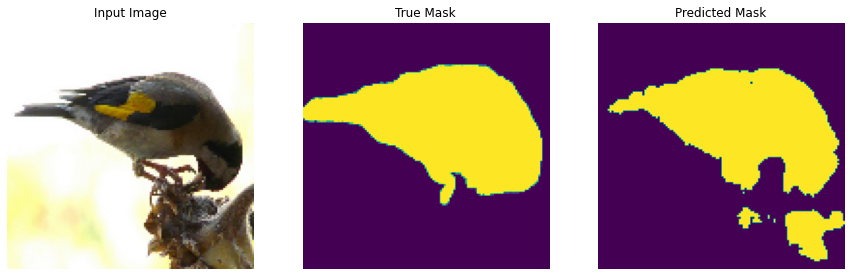

1


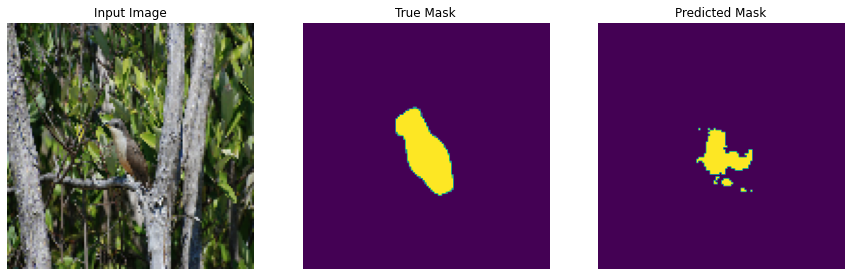

1


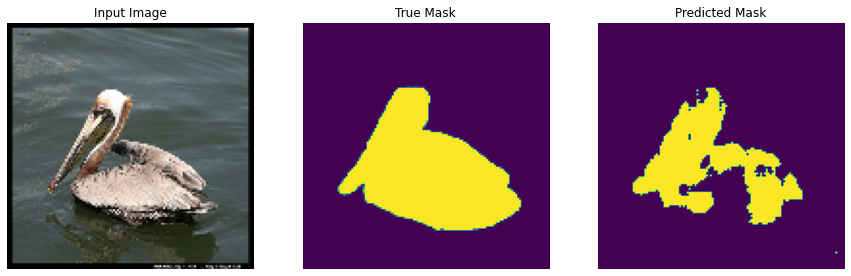

1


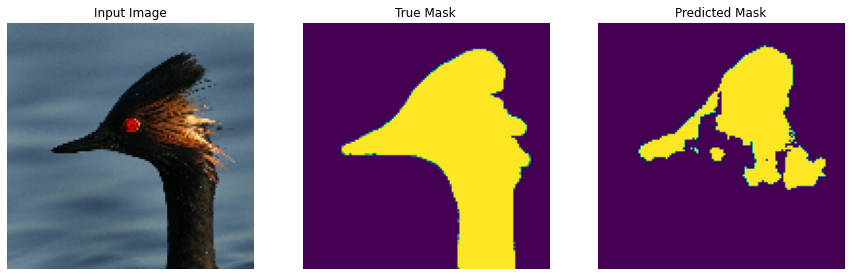

In [25]:
show_predictions(test_dataset, 20)

Построение графиков потерь и метрик

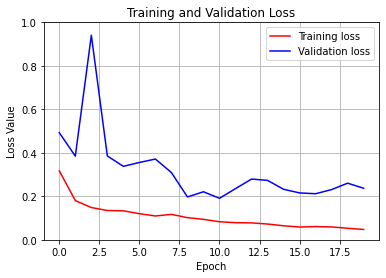

In [138]:
loss_1 = model_history_1.history['loss']
val_loss_1 = model_history_1.history['val_loss']

epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, loss_1, 'r', label='Training loss')
plt.plot(epochs, val_loss_1, 'r', color='b', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.grid('on')
plt.legend()
plt.show()

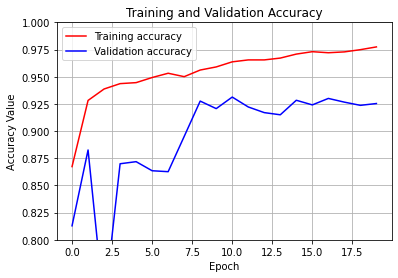

In [137]:
accuracy_1 = model_history_1.history['accuracy']
val_accuracy_1 = model_history_1.history['val_accuracy']

epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, accuracy_1, 'r', label='Training accuracy')
plt.plot(epochs, val_accuracy_1, 'r', color='b', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy Value')
plt.ylim([0.8, 1])
plt.grid('on')
plt.legend()
plt.show()

Точность на последнем шаге

In [28]:
val_accuracy_1[EPOCHS-1]

0.9253451228141785

Максимальная точность на шаге

In [29]:
max(val_accuracy_1)

0.9312846064567566

In [30]:
val_accuracy_1

[0.8128738403320312,
 0.8826026916503906,
 0.7379010319709778,
 0.8699480891227722,
 0.8718643188476562,
 0.8635101318359375,
 0.8626607060432434,
 0.8950474858283997,
 0.9275868535041809,
 0.9206581115722656,
 0.9312846064567566,
 0.9221878051757812,
 0.9169781804084778,
 0.9149856567382812,
 0.9283459782600403,
 0.9240862727165222,
 0.9300346374511719,
 0.9266192317008972,
 0.923675537109375,
 0.9253451228141785]

## Базовая модель с больш**и**м количеством карт признаков в апсемплере и другими слоями декодера

In [31]:
# Слои декодера из предтренированной модели
layer_names = [
    'block_1_expand',   # 64x64
    #'block_1_expand_BN',
    #'block_1_expand_relu',
    'block_3_expand',   # 32x32
    #'block_3_expand_BN',
    #'block_3_expand_relu',
    'block_6_expand',   # 16x16
    #'block_6_expand_BN',
    #'block_6_expand_relu',
    'block_13_expand',  # 8x8
    #'block_13_expand_BN',
    #'block_13_expand_relu',
    'block_16_project',      # 4x4
]
layers = [base_model.get_layer(name).output for name in layer_names]

# Декодер
down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)

down_stack.trainable = False

Апсемплер

In [32]:
up_stack = [
    pix2pix.upsample(1024, 3),  # 4x4 -> 8x8
    pix2pix.upsample(512, 3),  # 8x8 -> 16x16
    pix2pix.upsample(256, 3),  # 16x16 -> 32x32
    pix2pix.upsample(128, 3),   # 32x32 -> 64x64
]

Функция создания модели

In [33]:
def unet_model(output_channels):
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])
  x = inputs

  # Downsampling through the model
  skips = down_stack(x)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      output_channels, 3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

Создание модели


In [34]:
model_2 = unet_model(OUTPUT_CHANNELS)
model_2.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

Архитектура модели.

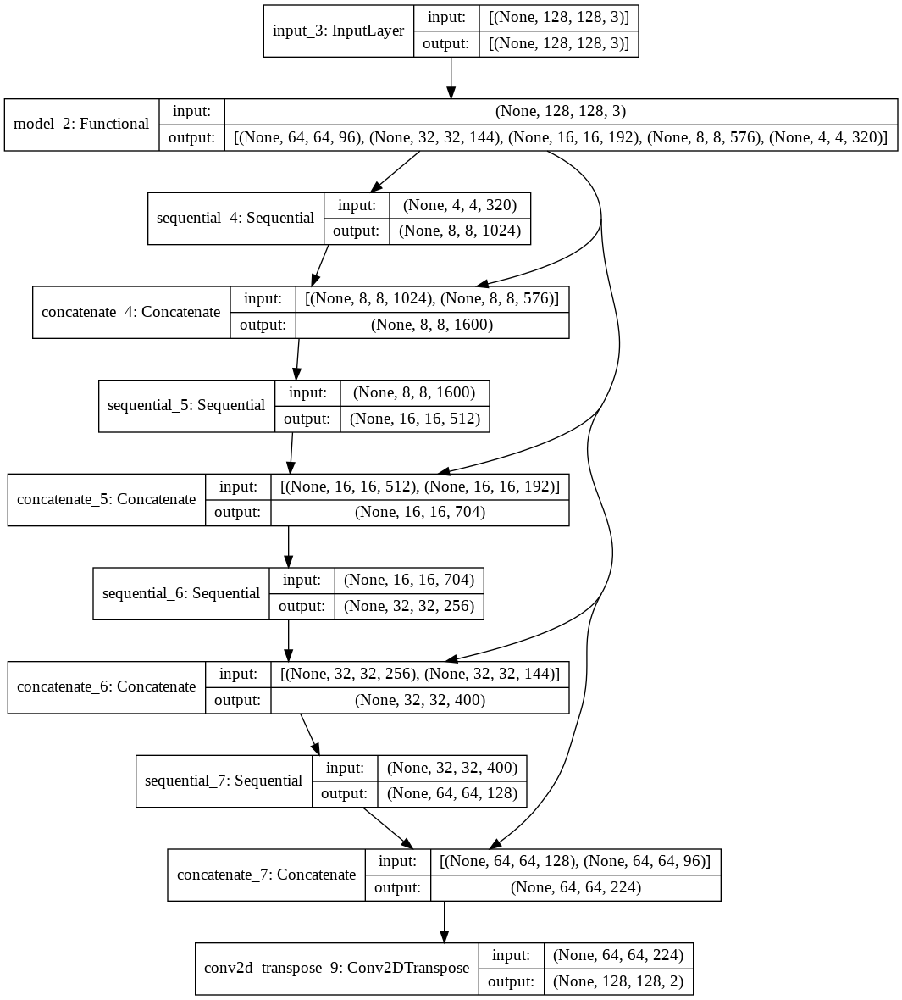

In [35]:
tf.keras.utils.plot_model(model_2, show_shapes=True)

In [36]:
def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      print(1)
      pred_mask = model_2.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image[0,:,:,:], sample_mask[0,:,:,:],
             create_mask(model_2.predict(sample_image[:,:,:]))])

Обучение модели

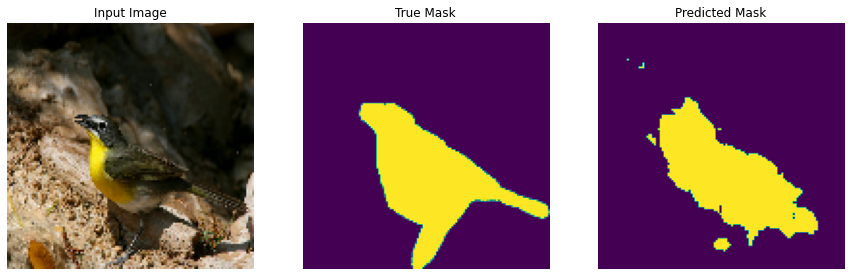


Sample Prediction after epoch 20



In [37]:
EPOCHS = 20
VAL_SUBSPLITS = 5
VALIDATION_STEPS = info.splits['test'].num_examples//10//BATCH_SIZE//VAL_SUBSPLITS

model_history_2 = model_2.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_dataset,
                          callbacks=[DisplayCallback()])

Предикты

1


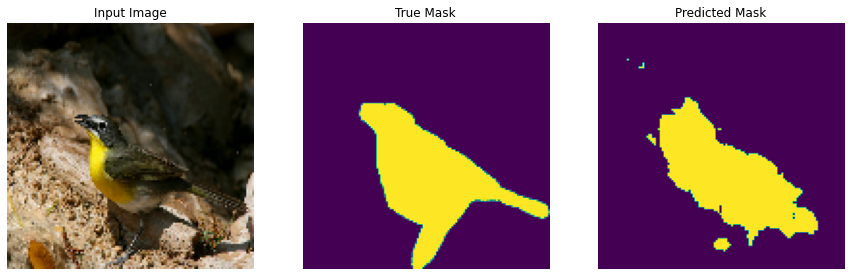

1


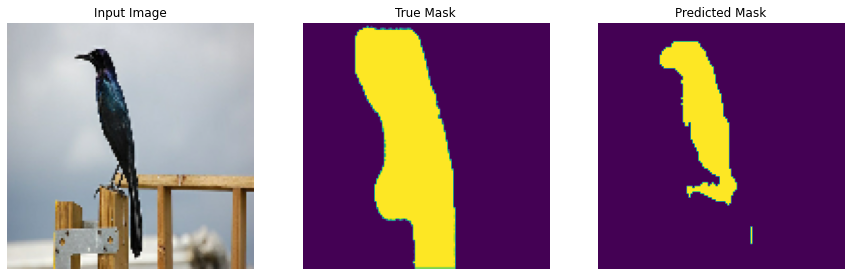

1


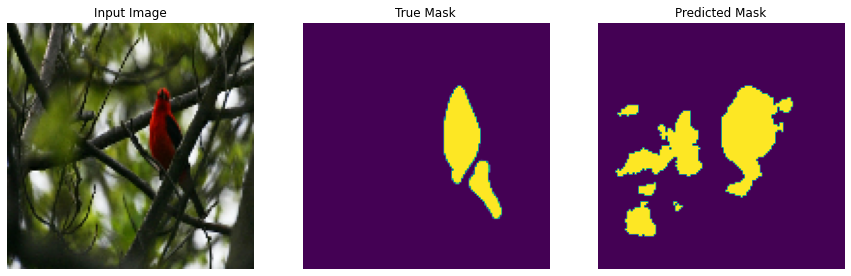

1


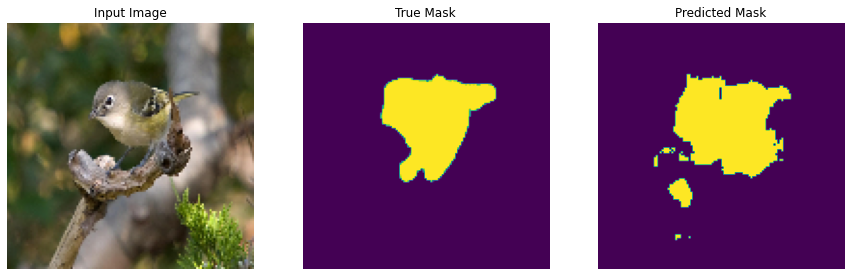

1


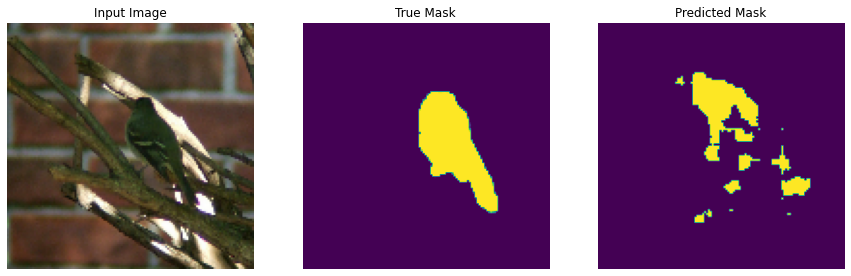

1


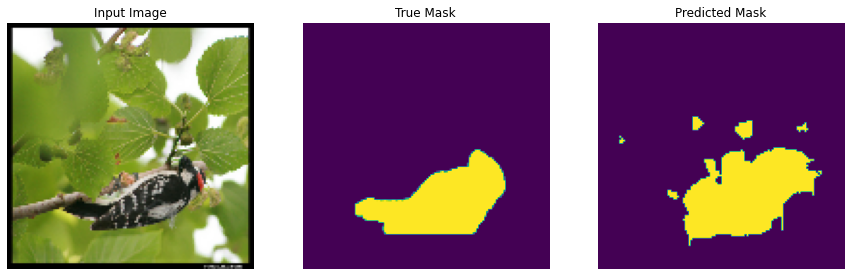

1


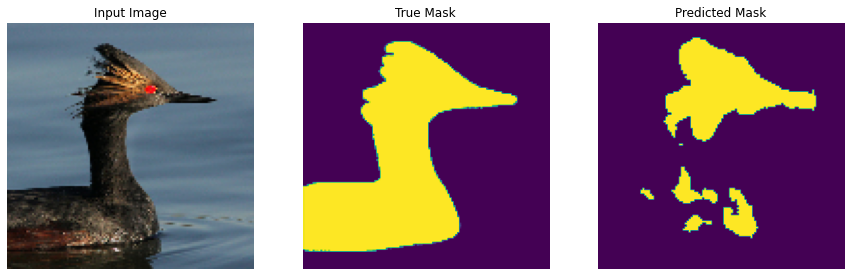

1


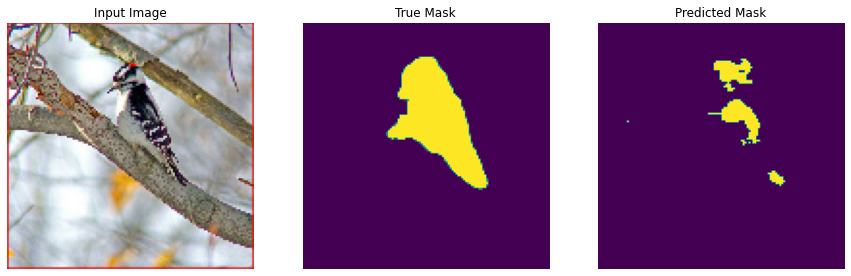

1


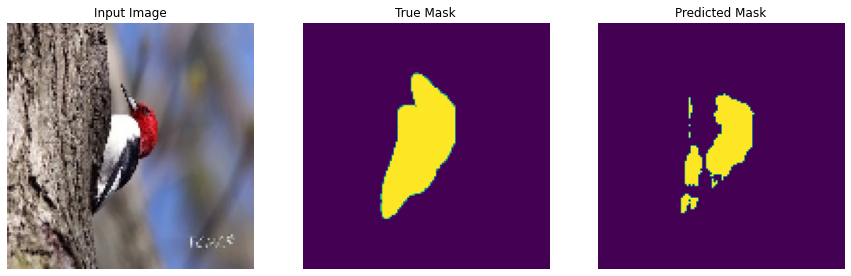

1


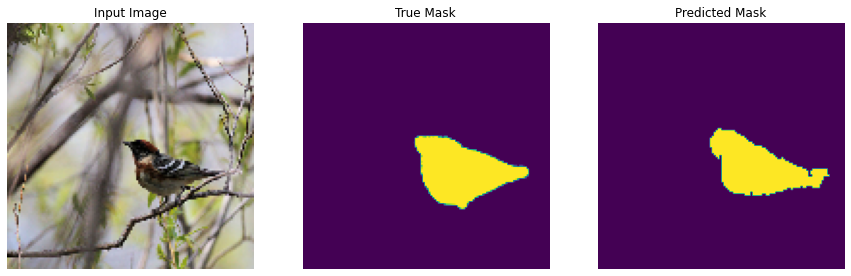

1


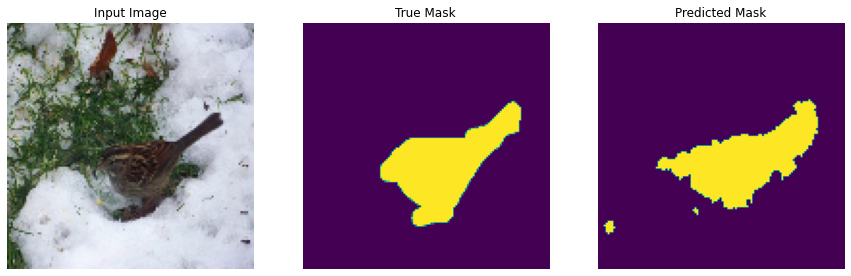

1


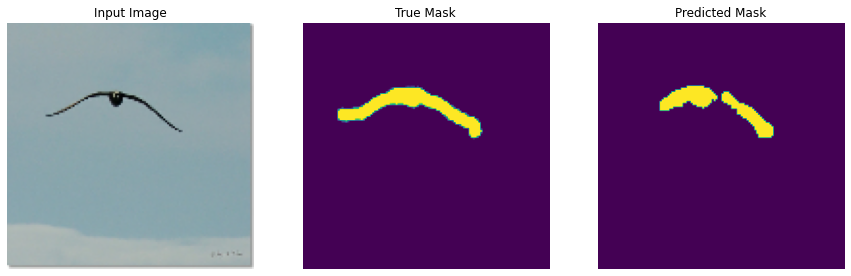

1


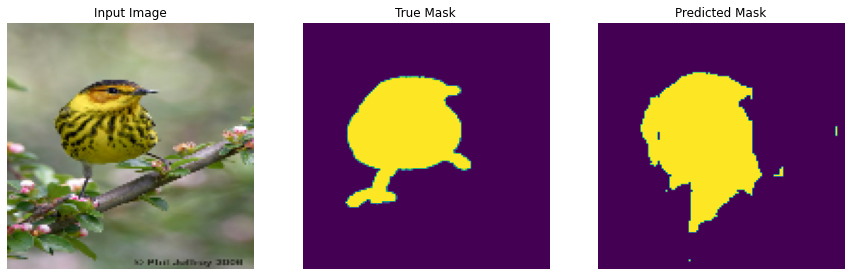

1


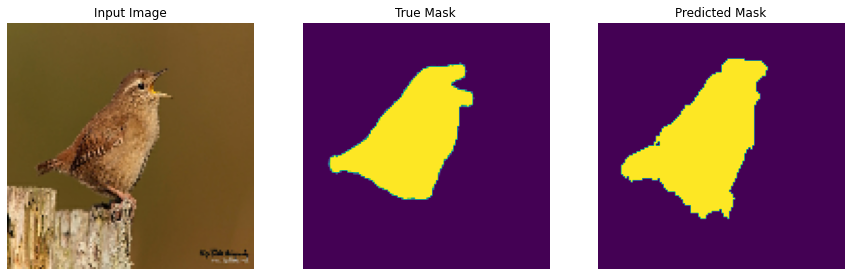

1


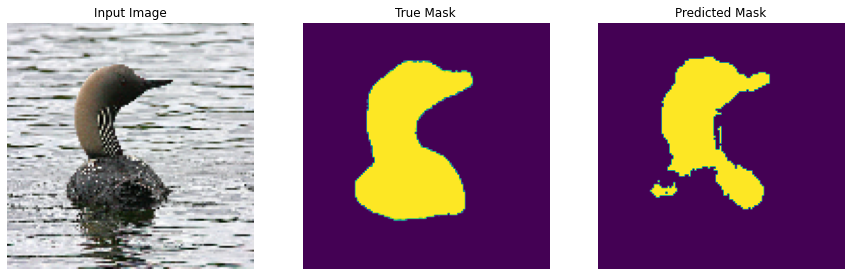

1


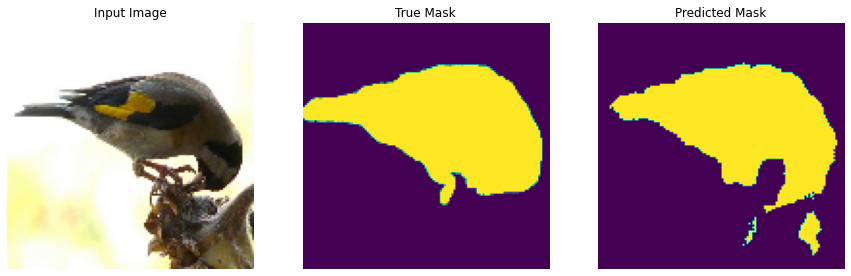

1


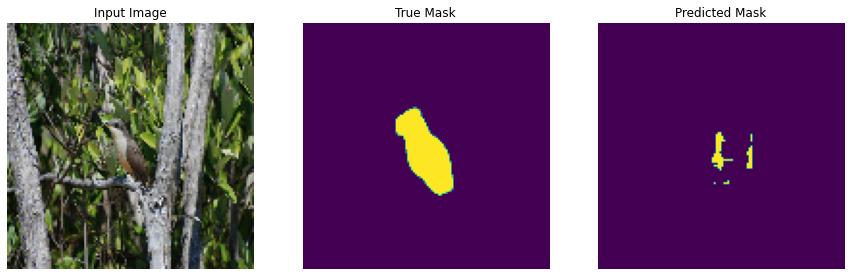

1


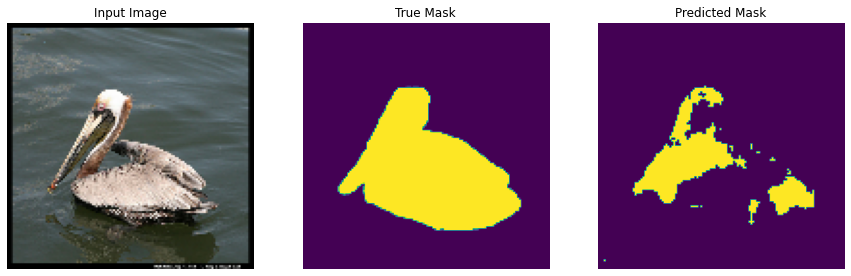

1


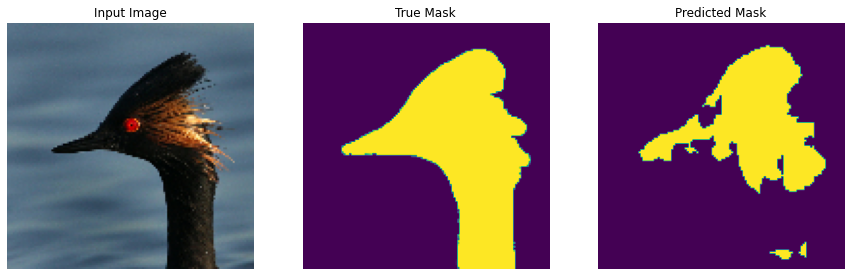

In [38]:
show_predictions(test_dataset, 20)

Построение графиков потерь и метрик

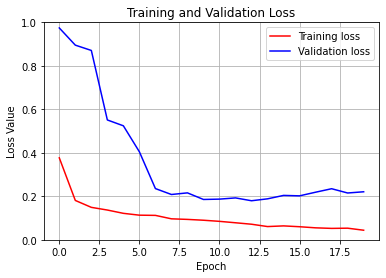

In [136]:
loss_2 = model_history_2.history['loss']
val_loss_2 = model_history_2.history['val_loss']

epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, loss_2, 'r', label='Training loss')
plt.plot(epochs, val_loss_2, 'r', color='b', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.grid('on')
plt.legend()
plt.show()

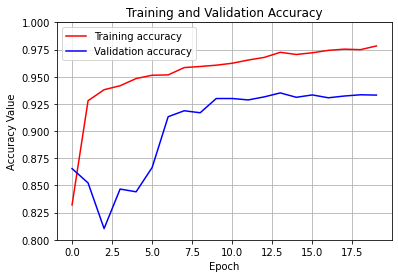

In [135]:
accuracy_2 = model_history_2.history['accuracy']
val_accuracy_2 = model_history_2.history['val_accuracy']

epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, accuracy_2, 'r', label='Training accuracy')
plt.plot(epochs, val_accuracy_2, 'r', color='b', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy Value')
plt.ylim([0.8, 1])
plt.grid('on')
plt.legend()
plt.show()

Точность на последнем шаге

In [41]:
val_accuracy_2[EPOCHS-1]

0.9331016540527344

Максимальная точность на шаге

In [42]:
max(val_accuracy_2)

0.9351056218147278

In [43]:
val_accuracy_2

[0.8654899597167969,
 0.8523305058479309,
 0.8103320002555847,
 0.846673309803009,
 0.8441543579101562,
 0.8665034174919128,
 0.9132207036018372,
 0.9186820983886719,
 0.9168612360954285,
 0.929931640625,
 0.9299583435058594,
 0.9286575317382812,
 0.9314613342285156,
 0.9351056218147278,
 0.9310734868049622,
 0.9332504272460938,
 0.930627167224884,
 0.932244598865509,
 0.9333839416503906,
 0.9331016540527344]

## U-Net с дополнительным фильтром на выходе

Функция создания модели

In [44]:
def unet_model(output_channels):
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])
  x = inputs

  # Downsampling through the model
  skips = down_stack(x)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      output_channels, 3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = MaxPooling2D()(x)
    
  x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = MaxPooling2D()(x)

  '''x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = MaxPooling2D()(x)
    
  x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = MaxPooling2D()(x)
 
  x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = MaxPooling2D()(x)

  x = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)

  x = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)

  x = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)'''

  x = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)

  x = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)

  x = Conv2D(2, (3, 3), activation='sigmoid', padding='same')(x)
   

  return tf.keras.Model(inputs=inputs, outputs=x)

Создание модели

In [45]:
model_3 = unet_model(OUTPUT_CHANNELS)
model_3.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

Архитектура модели.

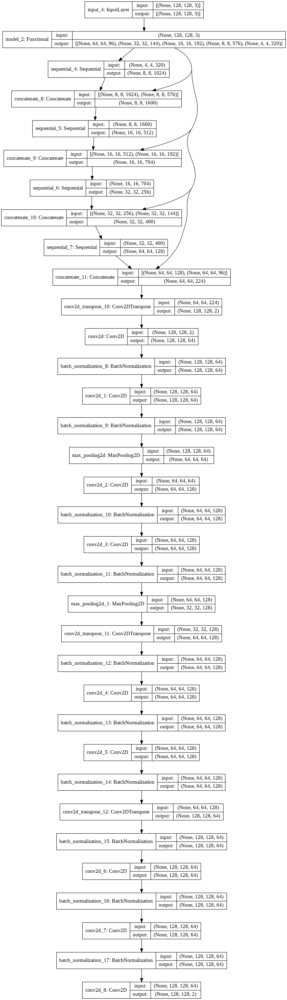

In [46]:
tf.keras.utils.plot_model(model_3, show_shapes=True)

In [47]:
def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      print(1)
      pred_mask = model_3.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image[0,:,:,:], sample_mask[0,:,:,:],
             create_mask(model_3.predict(sample_image[:,:,:]))])

Обучение модели

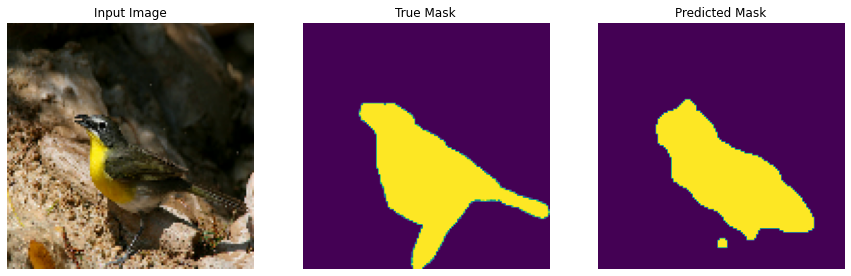


Sample Prediction after epoch 20



In [48]:
EPOCHS = 20 
VAL_SUBSPLITS = 5
VALIDATION_STEPS = info.splits['test'].num_examples//10//BATCH_SIZE//VAL_SUBSPLITS

model_history_3 = model_3.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_dataset,
                          callbacks=[DisplayCallback()])

Предикты

1


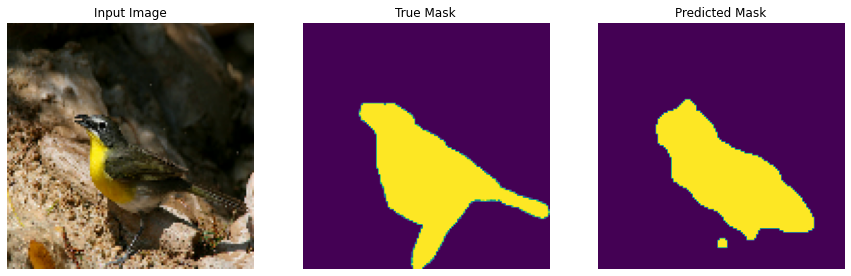

1


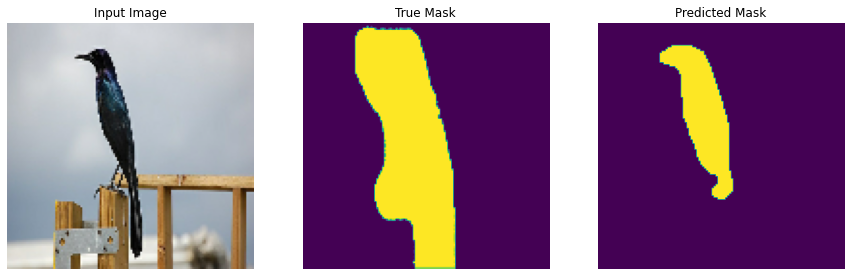

1


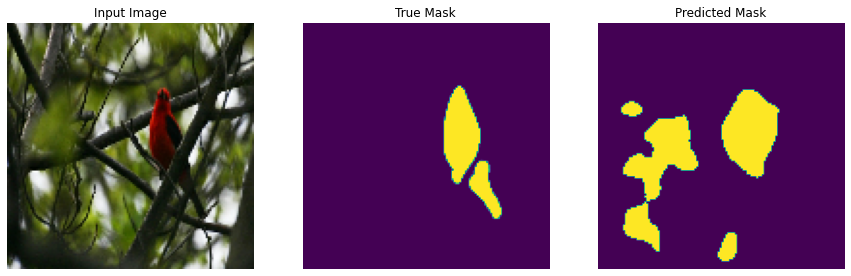

1


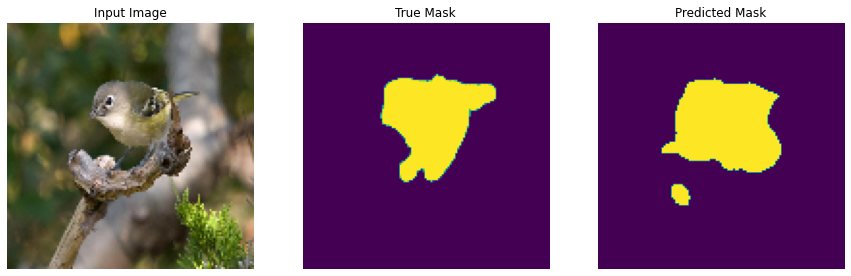

1


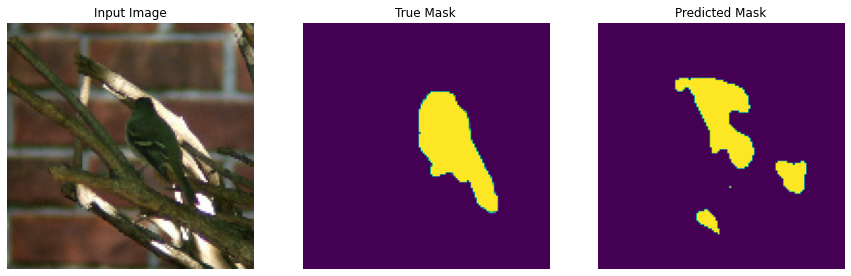

1


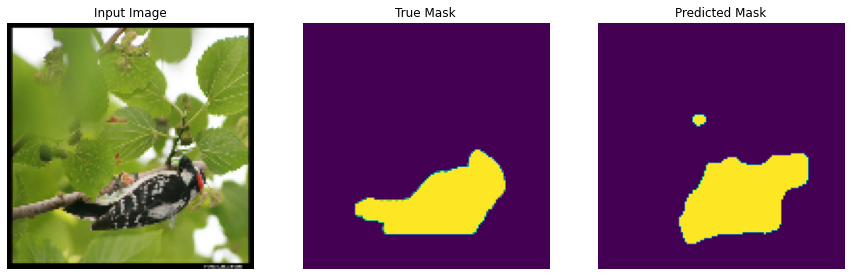

1


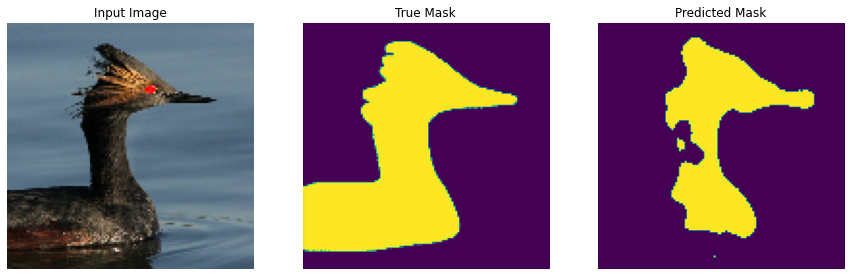

1


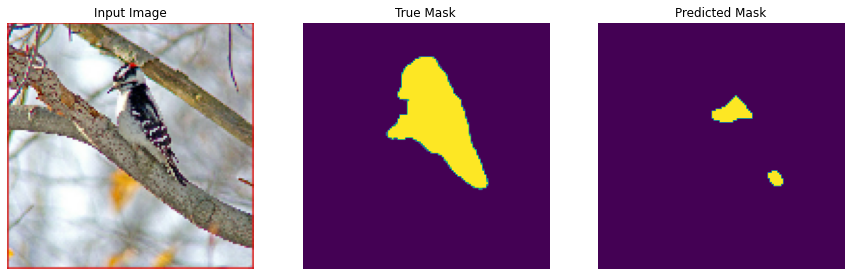

1


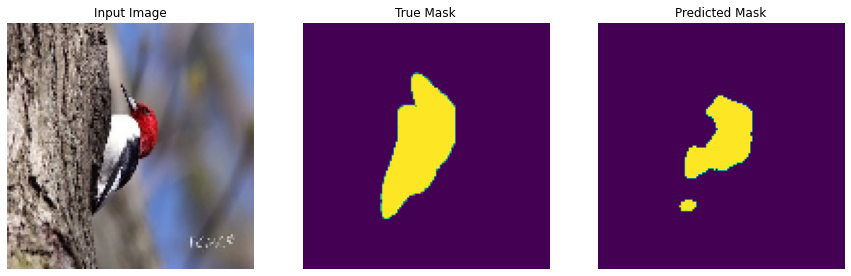

1


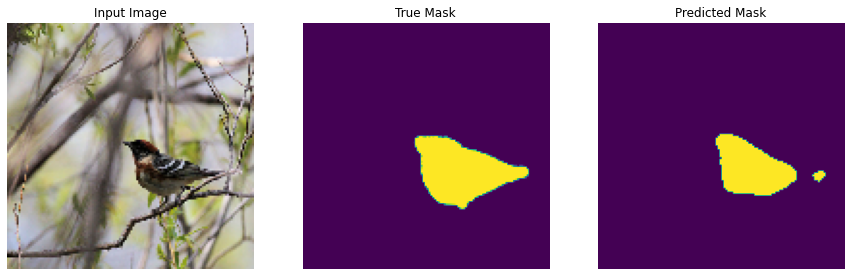

1


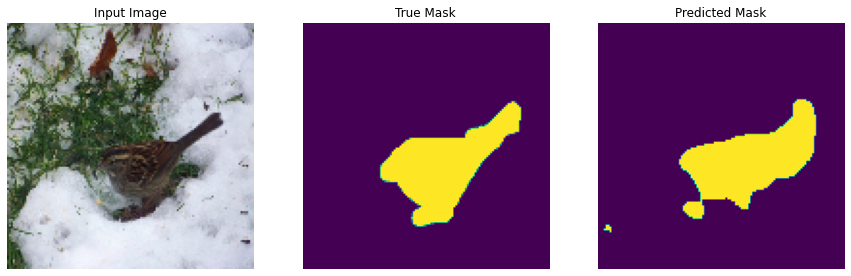

1


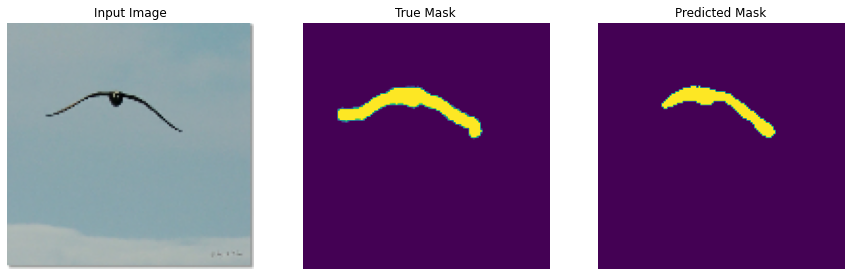

1


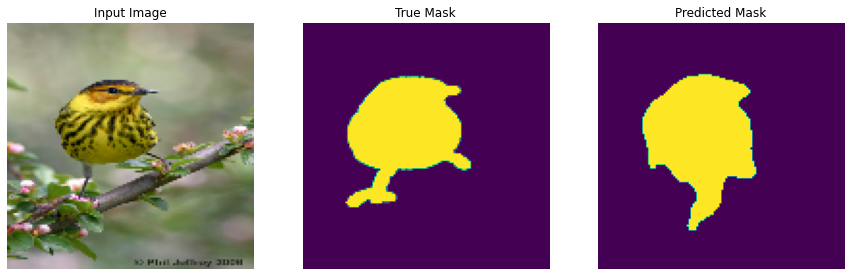

1


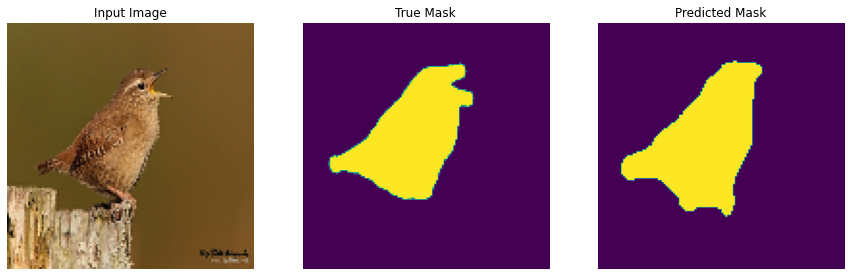

1


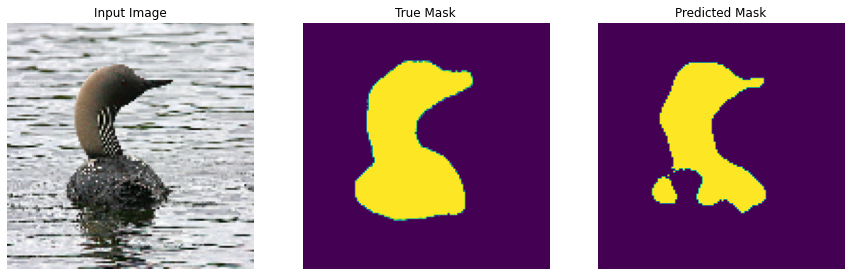

1


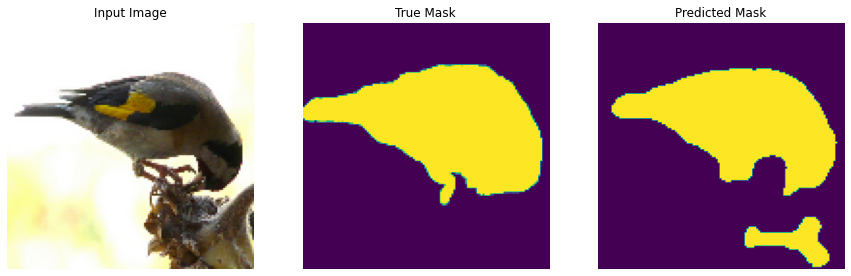

1


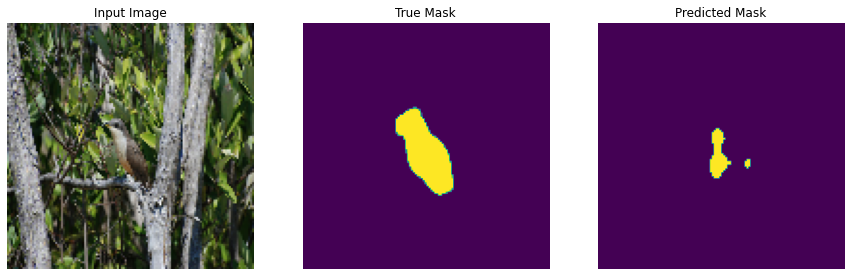

1


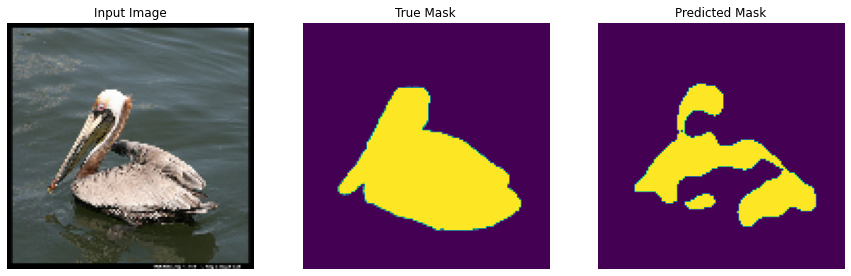

1


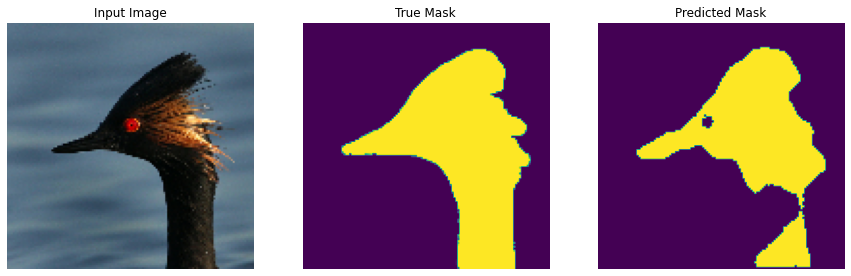

In [49]:
show_predictions(test_dataset, 20)

Построение графиков потерь и метрик

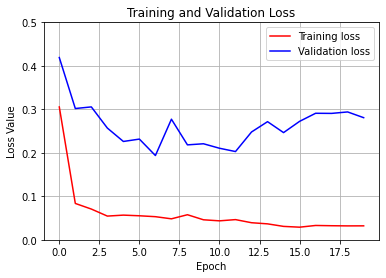

In [134]:
loss_3 = model_history_3.history['loss']
val_loss_3 = model_history_3.history['val_loss']

epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, loss_3, 'r', label='Training loss')
plt.plot(epochs, val_loss_3, 'r', color='b', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 0.5])
plt.grid('on')
plt.legend()
plt.show()

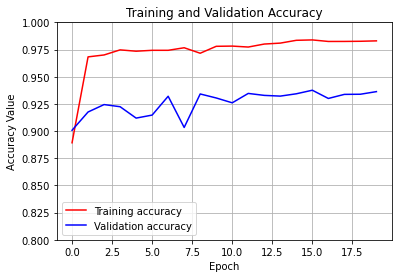

In [133]:
accuracy_3 = model_history_3.history['accuracy']
val_accuracy_3 = model_history_3.history['val_accuracy']

epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, accuracy_3, 'r', label='Training accuracy')
plt.plot(epochs, val_accuracy_3, 'r', color='b', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy Value')
plt.ylim([0.8, 1])
plt.grid('on')
plt.legend()
plt.show()

Точность на последнем шаге

In [52]:
val_accuracy_3[EPOCHS-1]

0.9362881779670715

Максимальная точность на шаге

In [53]:
max(val_accuracy_3)

0.9375788569450378

In [54]:
val_accuracy_3

[0.9007466435432434,
 0.9175555109977722,
 0.9243800044059753,
 0.9224116206169128,
 0.9119364619255066,
 0.9147122502326965,
 0.9320297241210938,
 0.9033381342887878,
 0.934136688709259,
 0.9304555058479309,
 0.9260037541389465,
 0.9346325993537903,
 0.9328333735466003,
 0.9321683049201965,
 0.9342994689941406,
 0.9375788569450378,
 0.9300091862678528,
 0.9337552189826965,
 0.9338887333869934,
 0.9362881779670715]

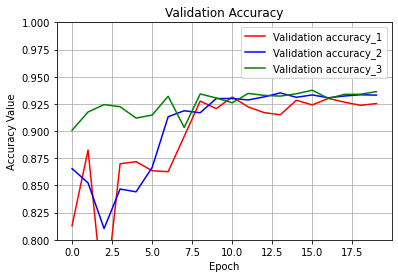

In [59]:
epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, val_accuracy_1, 'r', color='r', label='Validation accuracy_1')
plt.plot(epochs, val_accuracy_2, 'r', color='b', label='Validation accuracy_2')
plt.plot(epochs, val_accuracy_3, 'r', color='g', label='Validation accuracy_3')
plt.title('Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy Value')
plt.ylim([0.8, 1])
plt.grid('on')
plt.legend()
plt.show()

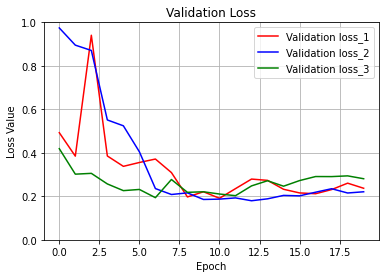

In [82]:
plt.figure()
plt.plot(epochs, val_loss_1, 'r', color='r', label='Validation loss_1')
plt.plot(epochs, val_loss_2, 'r', color='b', label='Validation loss_2')
plt.plot(epochs, val_loss_3, 'r', color='g', label='Validation loss_3')
plt.title('Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.grid('on')
plt.legend()
plt.show()

## **Вывод:** Незначительного увеличения точности модели удалось достич с помощью увеличения числа карт признаков в слоях, а так же добавлением фильтра на выходе модели.

## U-Net для датасета oxford_iiit_pet с дополнительным фильтром на выходе

In [109]:
ds_names = ( 'oxford_iiit_pet:3.*.*',)
dataset_all, info = tfds.load(ds_names[0], split = ['train[:10%]','test[-10%:]'], with_info=True)

In [110]:
@tf.function
def load_image_train(datapoint):
  input_image = tf.image.resize(datapoint['image'], (128, 128))
  input_mask = tf.image.resize(datapoint['segmentation_mask'], (128, 128))

  if tf.random.uniform(()) > 0.5:
    input_image = tf.image.flip_left_right(input_image)
    input_mask = tf.image.flip_left_right(input_mask)

  input_image, input_mask = normalize(input_image, input_mask)

  return input_image, input_mask

In [111]:
@tf.function
def load_image_test(datapoint):
  input_image = tf.image.resize(datapoint['image'], (128, 128))
  input_mask = tf.image.resize(datapoint['segmentation_mask'], (128, 128))

  input_image, input_mask = normalize(input_image, input_mask)

  return input_image, input_mask

Преобразования train test

In [112]:
def normalize(input_image, input_mask):
  input_image = tf.cast(input_image, tf.float32) / 255.0
  input_mask -= 1
  return input_image, input_mask

In [113]:
TRAIN_LENGTH = info.splits['train'].num_examples
BATCH_SIZE = 16
BUFFER_SIZE = 128
STEPS_PER_EPOCH = TRAIN_LENGTH // 10 // BATCH_SIZE

In [114]:
train = dataset_all[0].map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test = dataset_all[1].map(load_image_test)

In [115]:
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
test_dataset = test.batch(BATCH_SIZE)

Задание числа выходных каналов(классов)

In [116]:
OUTPUT_CHANNELS = 3

Декодер

In [117]:
# Use the activations of these layers
layer_names = [
    'block_1_expand',   # 64x64
    'block_3_expand',   # 32x32
    'block_6_expand',   # 16x16
    'block_13_expand',  # 8x8
    'block_16_project',      # 4x4
]
layers = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)

down_stack.trainable = False

Апсемплер

In [118]:
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

Функция создания модели

In [119]:
def unet_model(output_channels):
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])
  x = inputs

  # Downsampling through the model
  skips = down_stack(x)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      output_channels, 3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  x = Conv2D(32, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(32, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = MaxPooling2D()(x)
    
  x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = MaxPooling2D()(x)

  '''x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = MaxPooling2D()(x)
    
  x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = MaxPooling2D()(x)
 
  x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = MaxPooling2D()(x)

  x = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)

  x = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)

  x = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)'''

  x = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)

  x = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(32, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)
  x = Conv2D(32, (3, 3), padding='same', activation='relu')(x)
  x = BatchNormalization()(x)

  x = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)
   

  return tf.keras.Model(inputs=inputs, outputs=x)

Создание модели

In [120]:
model = unet_model(OUTPUT_CHANNELS)
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

Архитектура модели.

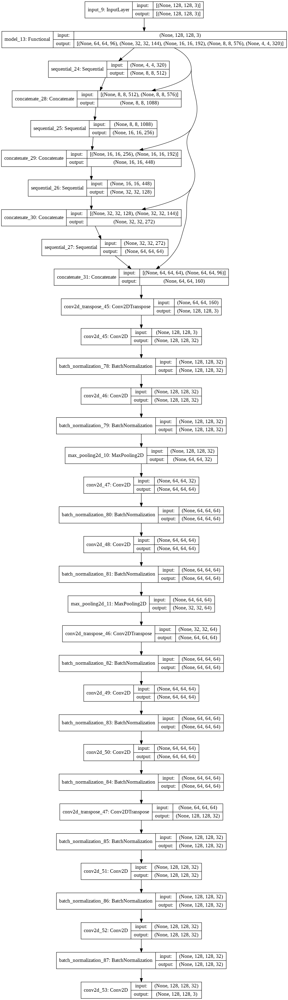

In [121]:
tf.keras.utils.plot_model(model, show_shapes=True)

In [122]:
def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      print(1)
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image[0,:,:,:], sample_mask[0,:,:,:],
             create_mask(model.predict(sample_image[:,:,:]))])

Обучение модели

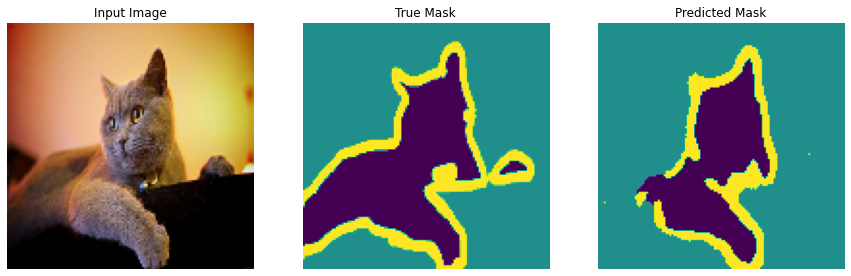


Sample Prediction after epoch 20



In [123]:
EPOCHS = 20 # увеличьте при необходимости
VAL_SUBSPLITS = 5
VALIDATION_STEPS = info.splits['test'].num_examples//10//BATCH_SIZE//VAL_SUBSPLITS

model_history = model.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_dataset,
                          callbacks=[DisplayCallback()])

Предикты

1


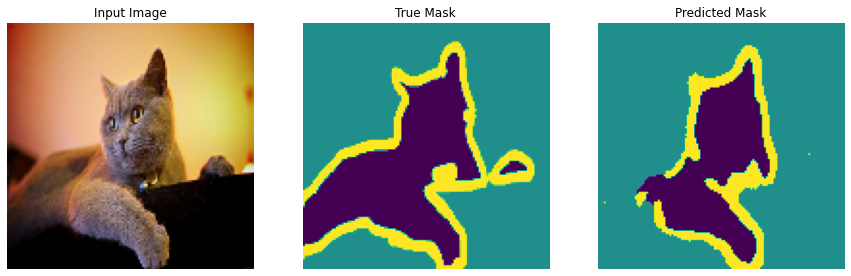

1


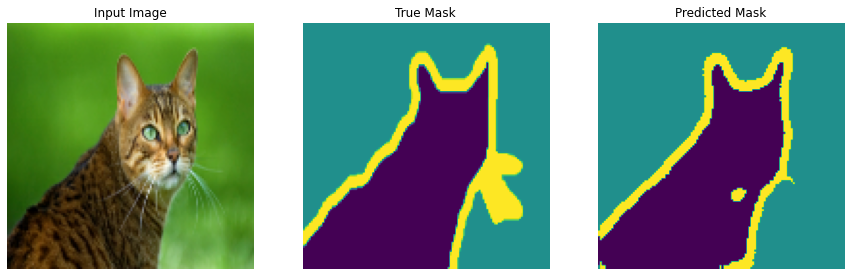

1


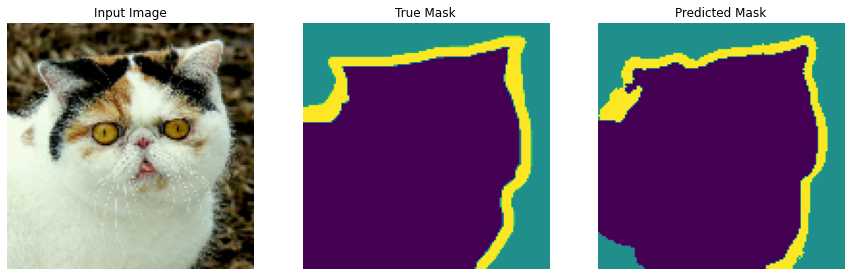

1


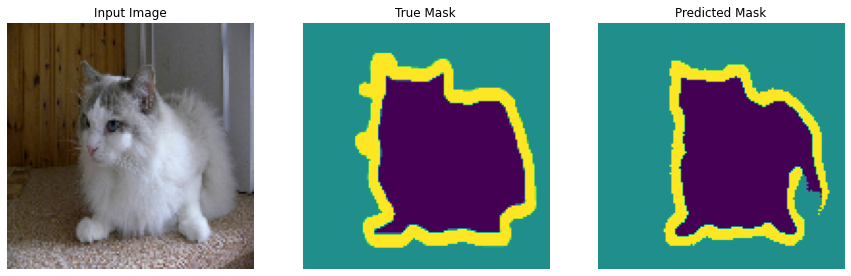

1


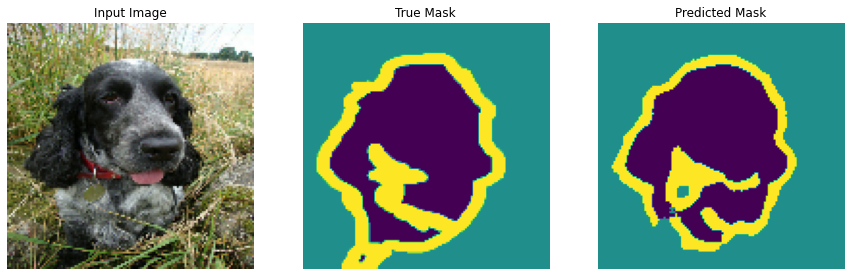

1


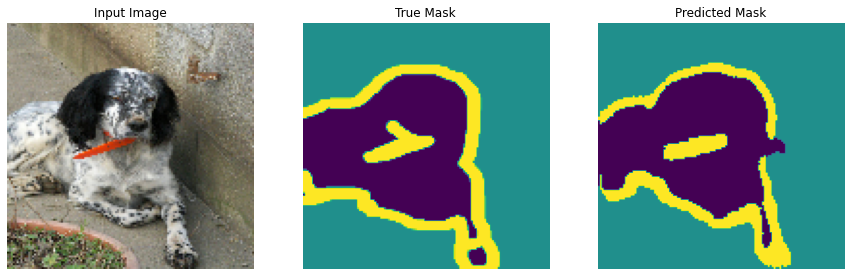

1


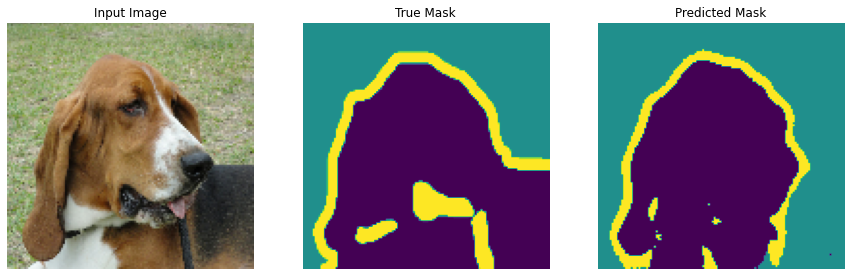

1


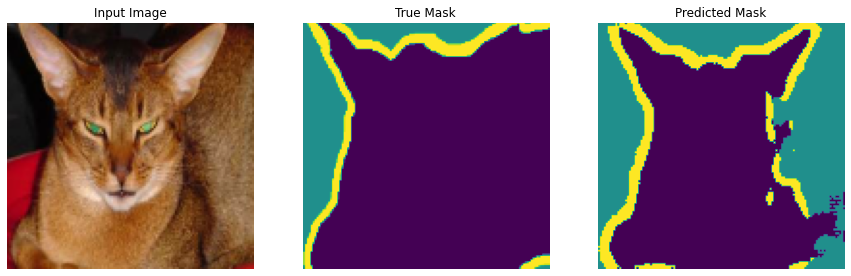

1


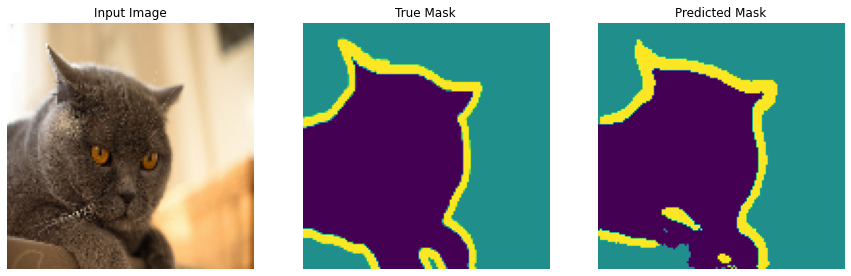

1


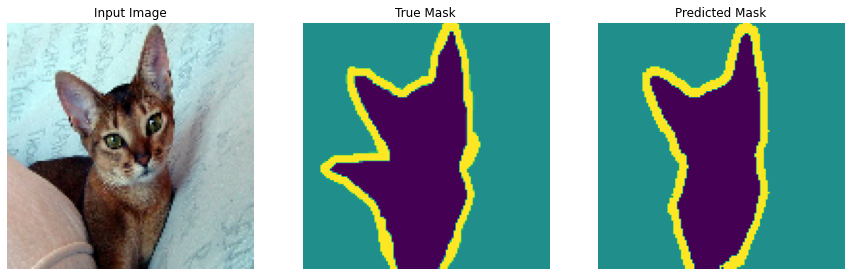

1


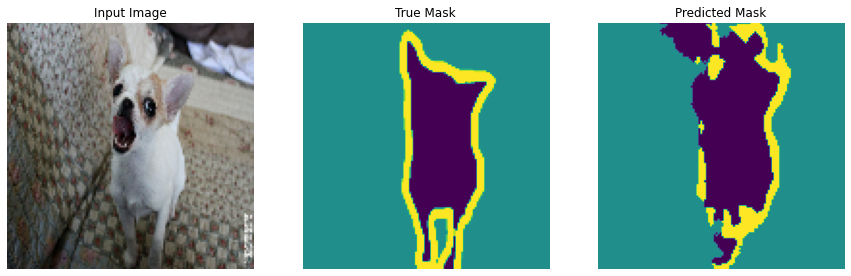

1


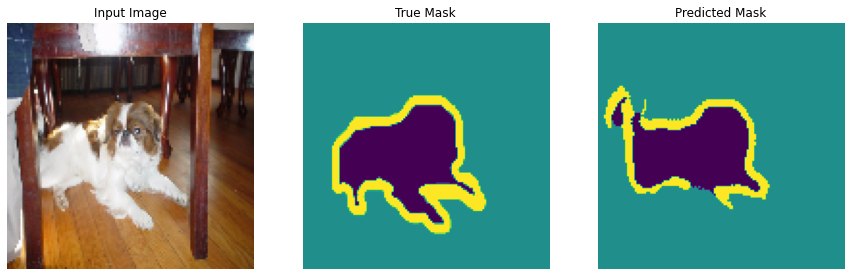

1


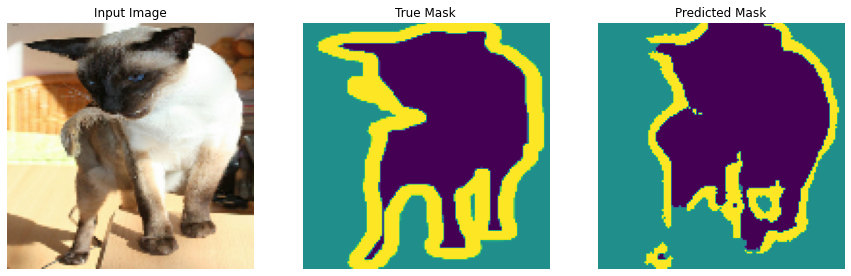

1


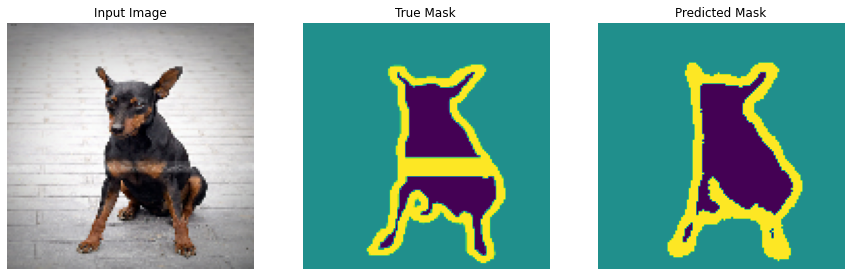

1


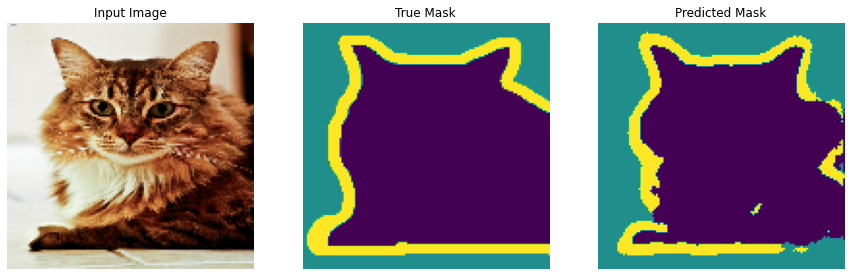

1


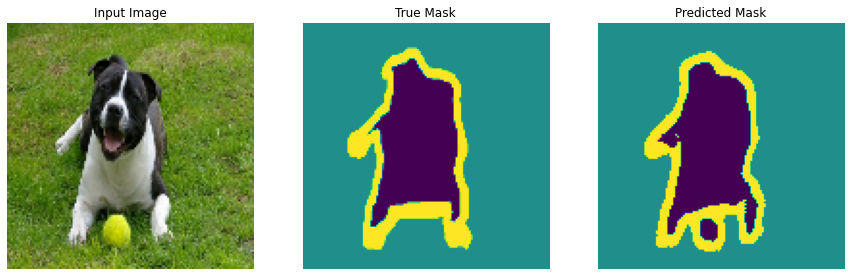

1


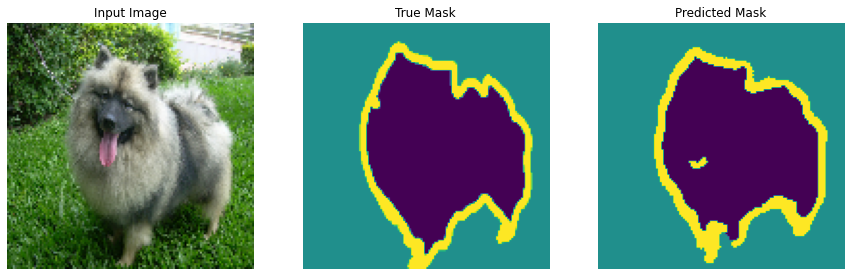

1


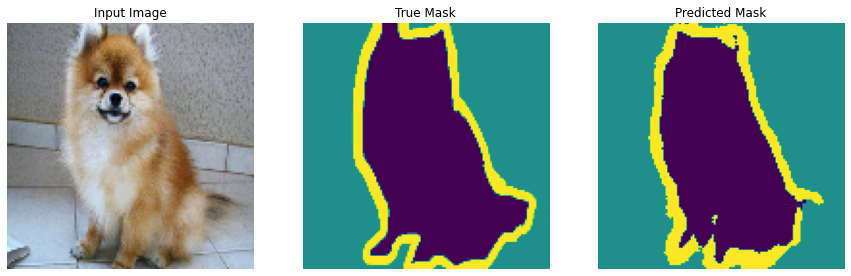

1


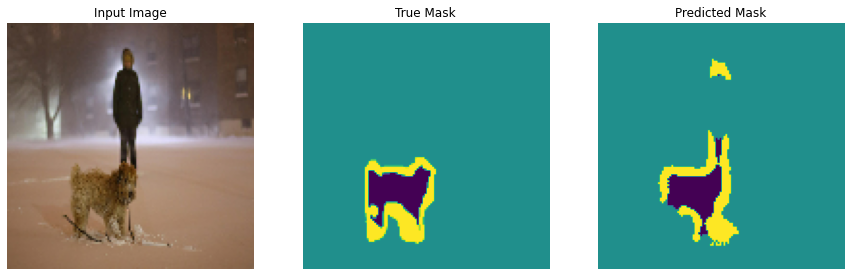

1


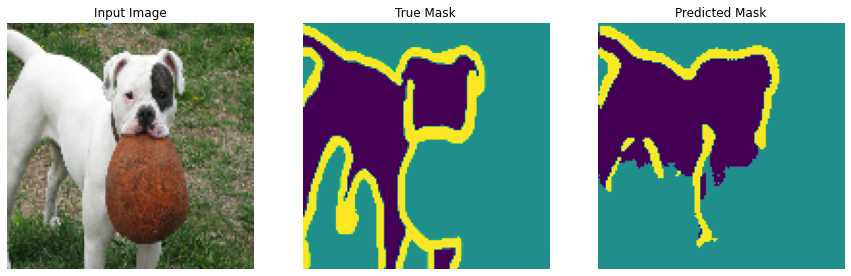

In [124]:
show_predictions(test_dataset, 20)

Построение графиков потерь и метрик

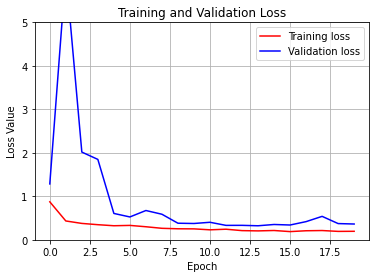

In [132]:
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'r', color="b", label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 5])
plt.grid('on')
plt.legend()
plt.show()

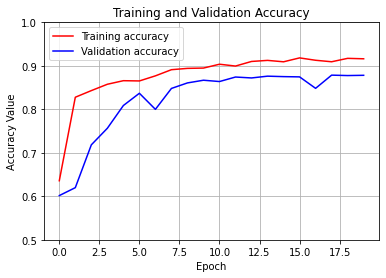

In [130]:
accuracy = model_history.history['accuracy']
val_accuracy = model_history.history['val_accuracy']

epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, accuracy, 'r', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', color='b', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy Value')
plt.ylim([0.5, 1])
plt.grid('on')
plt.legend()
plt.show()

Точность на последнем шаге

In [127]:
val_accuracy[EPOCHS-1]

0.8782577514648438

Максимальная точность на шаге

In [128]:
max(val_accuracy)

0.8786249160766602

In [129]:
val_accuracy

[0.6016788482666016,
 0.6199169158935547,
 0.7183914184570312,
 0.7564554214477539,
 0.8087749481201172,
 0.8369531631469727,
 0.7999677658081055,
 0.8480606079101562,
 0.8607425689697266,
 0.8669281005859375,
 0.8639211654663086,
 0.8742885589599609,
 0.8721780776977539,
 0.8762760162353516,
 0.8752298355102539,
 0.8746356964111328,
 0.8482990264892578,
 0.8786249160766602,
 0.8776798248291016,
 0.8782577514648438]

## В моделе с 3мя классами так же помогло увеличение числа карт признаков в слоях и дополнительный фильтр на выходе